In [4]:
!pip install opendatasets

In [5]:
import opendatasets as od

In [7]:
download_url = 'https://www.kaggle.com/datasets/sobhanmoosavi/us-accidents'
od.download(download_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: nayanagal
Your Kaggle Key: ········


100%|██████████| 269M/269M [09:42<00:00, 484kB/s] 


In [4]:
data_filename = './us-accidents/US_Accidents_Dec21_updated.csv'

In [1]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np

# Data Preparation and cleaning

In [5]:
df = pd.read_csv(data_filename)

In [6]:
df.head()

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


In [8]:
df.shape

(2845342, 47)

In [9]:
df.columns

Index(['ID', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat', 'Start_Lng',
       'End_Lat', 'End_Lng', 'Distance(mi)', 'Description', 'Number', 'Street',
       'Side', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [10]:
df.isnull().sum().sort_values(ascending=False)

Number                   1743911
Precipitation(in)         549458
Wind_Chill(F)             469643
Wind_Speed(mph)           157944
Wind_Direction             73775
Humidity(%)                73092
Weather_Condition          70636
Visibility(mi)             70546
Temperature(F)             69274
Pressure(in)               59200
Weather_Timestamp          50736
Airport_Code                9549
Timezone                    3659
Nautical_Twilight           2867
Civil_Twilight              2867
Sunrise_Sunset              2867
Astronomical_Twilight       2867
Zipcode                     1319
City                         137
Street                         2
Country                        0
Junction                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Turning_Loop                   0
Traffic_Signal                 0
Traffic_Calming                0
Stop                           0
Station                        0
Roundabout

In [11]:
#Removing Columns that i don't need
df.drop(['Number','Precipitation(in)','Wind_Chill(F)','Wind_Speed(mph)','Wind_Direction'],axis = 1, inplace = True)

# Exploratory Analysis and Visualisation

In [12]:
# Columns used - City,Start Time,Start Lat,Start Lng,Temp,Weather Condition,Severity

In [15]:
cities = df.City.unique()
len(cities)

11682

In [47]:
cities_by_accident = df.City.value_counts()
cities_by_accident[:10]

Miami          106966
Los Angeles     68956
Orlando         54691
Dallas          41979
Houston         39448
Charlotte       33152
Sacramento      32559
San Diego       26627
Raleigh         22840
Minneapolis     22768
Name: City, dtype: int64

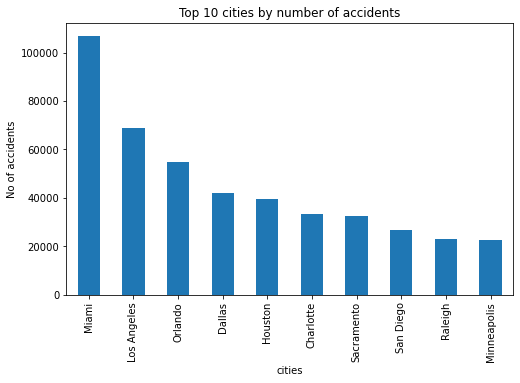

In [48]:
# Bar Chart to Visualize Top 10 cities by number of accidents
plt.figure(figsize=(8,5))
cities_by_accident[:10].plot(kind='bar')
plt.xlabel("cities")
plt.ylabel("No of accidents")
plt.title("Top 10 cities by number of accidents")
plt.show()

In [49]:
'New York' in df['City']

False

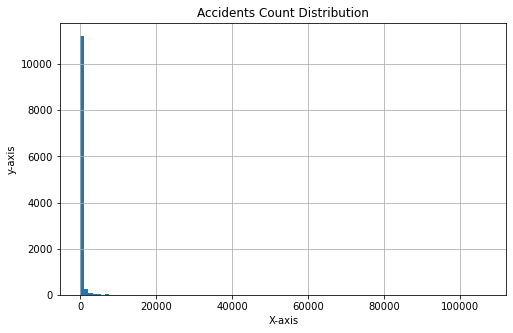

In [50]:
# Let's see how the accidents by cities is distributed
plt.figure(figsize=(8,5))
cities_by_accident.hist(bins=100)

plt.xlabel("X-axis")
plt.ylabel("y-axis")
plt.title('Accidents Count Distribution')

plt.show()

We can see that majority of the cities have less than 5000 accidents, most cities accidents count is closer to 1000

In [51]:
# Let's group the data by high and low
high_accident_cities = cities_by_accident = cities_by_accident[cities_by_accident>=1000]
low_accident_cities = cities_by_accident = cities_by_accident[cities_by_accident<1000]

In [52]:
# Let's find percentages

len(high_accident_cities)/len(cities)


0.04245848313644924

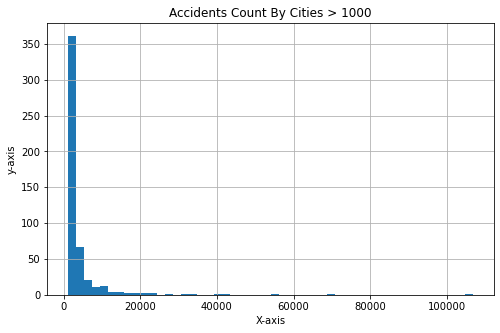

In [53]:
# Zoom in on the data distribution for cities with high accidents

plt.figure(figsize=(8,5))

high_accident_cities.hist(bins = 50)

plt.xlabel("X-axis")
plt.ylabel("y-axis")
plt.title('Accidents Count By Cities > 1000')

plt.show()



In [54]:
len(low_accident_cities)/len(cities)

0.0

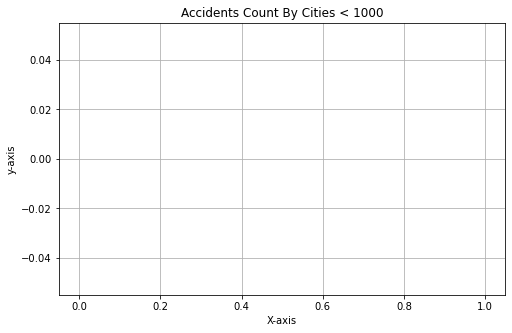

In [55]:
# Zoom in on the data distribution for cities with low accidents

plt.figure(figsize=(8,5))

low_accident_cities.hist(bins = 50)

plt.xlabel("X-axis")
plt.ylabel("y-axis")
plt.title('Accidents Count By Cities < 1000')

plt.show()

In [39]:
# Accidents by Severity
df.head(1)

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.10891,-83.09286,40.11206,-83.03187,3.23,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night


In [30]:
df.groupby('Severity').Severity.count()

Severity
1      26053
2    2532991
3     155105
4     131193
Name: Severity, dtype: int64

In [34]:
accidents_severity = df.groupby('Severity').count()['ID']
accidents_severity

Severity
1      26053
2    2532991
3     155105
4     131193
Name: ID, dtype: int64

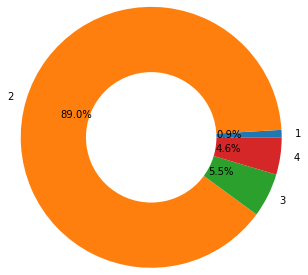

In [45]:
# Let's visualise through donought chart
label = [1,2,3,4]
plt.figure(figsize=(3,3))
plt.pie(accidents_severity,labels=label,autopct='%1.1f%%',radius=2)
plt.pie([1],colors=['w'],radius=1)
#plt.title("Accident by Severity")
plt.show()

4.6 % of the accidents recorded were found to be very severe.

## Visualisation with Time

In [56]:
# Let's work with dates now
# First convert object to datetime

In [60]:
df.Start_Time.dtypes

dtype('O')

In [61]:
df['End_Time'].dtypes

dtype('O')

In [65]:
df.Start_Time = pd.to_datetime(df.Start_Time)
df.End_Time = pd.to_datetime(df.End_Time)

In [66]:
df.Start_Time.dtypes

dtype('<M8[ns]')

In [67]:
df.Start_Time[0]

Timestamp('2016-02-08 00:37:08')

In [68]:
df.End_Time[0]

Timestamp('2016-02-08 06:37:08')

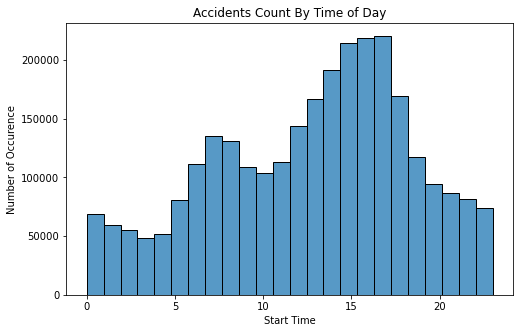

In [75]:
# Plot the distribution of occurence by time of the day.
plt.figure(figsize=(8,5))
sns.histplot(df['Start_Time'].dt.hour, bins = 24)    # We took hour from 'Start_Time using dt.hour'

plt.xlabel("Start Time")
plt.ylabel("Number of Occurence")
plt.title('Accidents Count By Time of Day')

plt.show()

More accidents happened between 7am-8am, and 4pm-5pm.

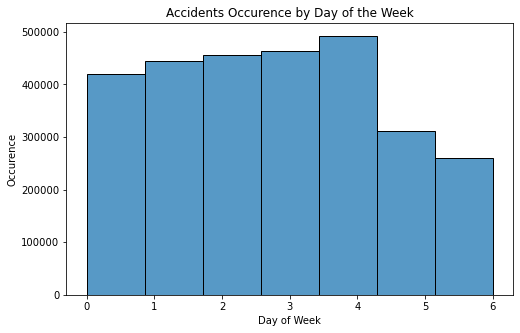

In [70]:
# Let's plot by day of the week 
plt.figure(figsize=(8,5))
sns.histplot(df['Start_Time'].dt.dayofweek, bins = 7)    # We took hour from 'Start_Time using dt.hour'

plt.xlabel("Day of Week")
plt.ylabel("Occurence")
plt.title('Accidents Occurence by Day of the Week')

plt.show()

Accidents occurence are high on weekdays(highest on Friday) & low on weekends(lowest on Sundays), both evenly distributed.

In [71]:
# Now let's analyse accident patteron on weekends

In [72]:
# Create a variable of the weekend days (Saturday & Sunday) for the next analysis

saturday = df[df['Start_Time'].dt.dayofweek == 5]
sunday = df[df['Start_Time'].dt.dayofweek == 6]

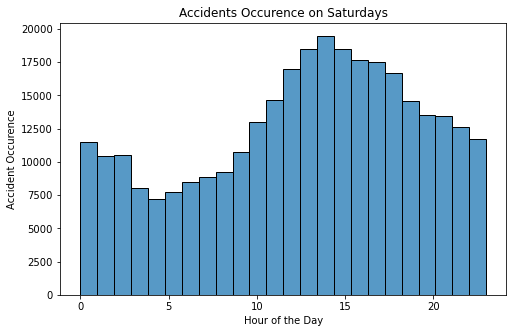

In [73]:
# The accident occurence pattern on Saturday
plt.figure(figsize=(8,5))
sns.histplot(saturday['Start_Time'].dt.hour, bins = 24)

plt.xlabel("Hour of the Day")
plt.ylabel("Accident Occurence")
plt.title('Accidents Occurence on Saturdays')

plt.show()

Most accidents occur at 1pm-3pm on Saturdays

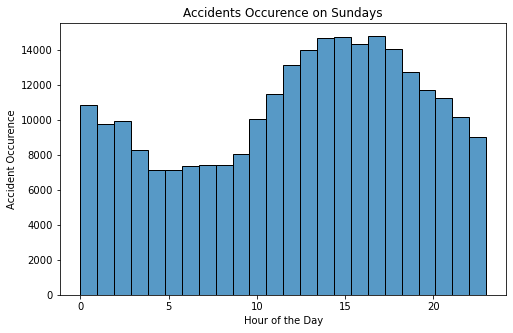

In [74]:
# The accident occurence pattern on Sundays
plt.figure(figsize=(8,5))
sns.histplot(sunday['Start_Time'].dt.hour, bins = 24)

plt.xlabel("Hour of the Day")
plt.ylabel("Accident Occurence")
plt.title('Accidents Occurence on Sundays')

plt.show()

Most accidents occur at 2pm-4pm on Sundays

In [77]:
#accident patteron on Friday
friday = df[df['Start_Time'].dt.dayofweek == 4]

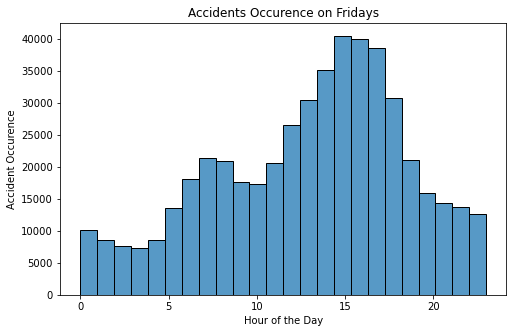

In [78]:
plt.figure(figsize=(8,5))
sns.histplot(friday['Start_Time'].dt.hour, bins = 24)

plt.xlabel("Hour of the Day")
plt.ylabel("Accident Occurence")
plt.title('Accidents Occurence on Fridays')

plt.show()

Most accidents occur at 3pm-6pm on Fridays


In [79]:
# Let's analyse accident pattern by month of the year

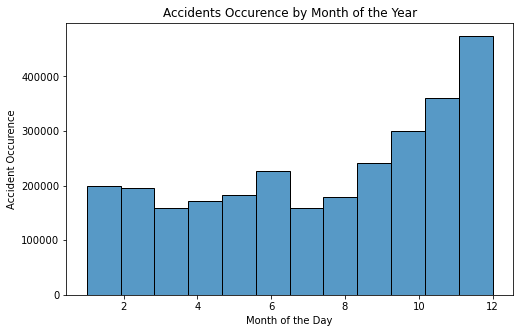

In [81]:
plt.figure(figsize=(8,5))
sns.histplot(df['Start_Time'].dt.month, bins = 12)

plt.xlabel("Month of the Day")
plt.ylabel("Accident Occurence")
plt.title('Accidents Occurence by Month of the Year')

plt.show()

Most accidents happened during November-December

In [82]:
# Let's analyse accident pattern through individual years(2016-2019)

In [90]:
df.Start_Time.dt.year

0          2016
1          2016
2          2016
3          2016
4          2016
           ... 
2845337    2019
2845338    2019
2845339    2019
2845340    2019
2845341    2019
Name: Start_Time, Length: 2845342, dtype: int64

In [83]:
#1.2016
dt_2016 = df[df['Start_Time'].dt.year==2016]

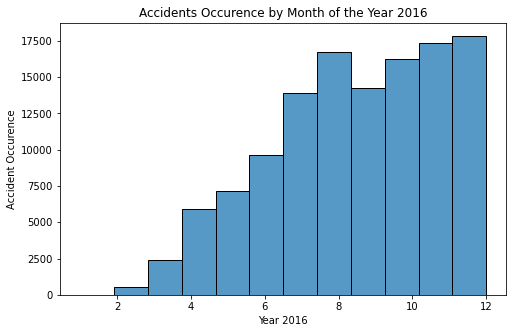

In [86]:
plt.figure(figsize=(8,5))
sns.histplot(dt_2016['Start_Time'].dt.month, bins = 12)

plt.xlabel("Year 2016")
plt.ylabel("Accident Occurence")
plt.title('Accidents Occurence by Month of the Year 2016')

plt.show()

Most Accidents happened during December in 2016

In [88]:
#2.2017
dt_2017 = df[df['Start_Time'].dt.year==2017]

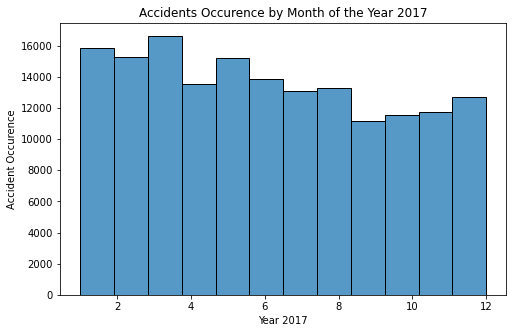

In [89]:
plt.figure(figsize=(8,5))
sns.histplot(dt_2017['Start_Time'].dt.month, bins = 12)

plt.xlabel("Year 2017")
plt.ylabel("Accident Occurence")
plt.title('Accidents Occurence by Month of the Year 2017')

plt.show()

Most Accidents happened during March in 2017


In [91]:
#3.2018
dt_2018 = df[df['Start_Time'].dt.year==2018]

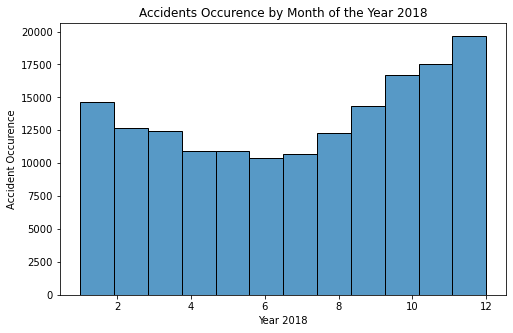

In [92]:
plt.figure(figsize=(8,5))
sns.histplot(dt_2018['Start_Time'].dt.month, bins = 12)

plt.xlabel("Year 2018")
plt.ylabel("Accident Occurence")
plt.title('Accidents Occurence by Month of the Year 2018')

plt.show()

Most Accidents happened during December in 2018


In [93]:
#3.2019
dt_2019 = df[df['Start_Time'].dt.year==2019]

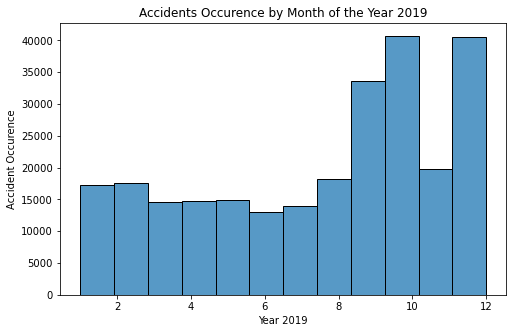

In [98]:
plt.figure(figsize=(8,5))
sns.histplot(dt_2019['Start_Time'].dt.month, bins = 12)

plt.xlabel("Year 2019")
plt.ylabel("Accident Occurence")
plt.title('Accidents Occurence by Month of the Year 2019')

plt.show()

Most Accidents happened during October and December in 2018


# Accident pattern by Road Side

In [99]:
# Side of the road

side_of_road =  df.groupby(['Side']).count()['ID']
side_of_road

Side
L     492032
N          1
R    2353309
Name: ID, dtype: int64

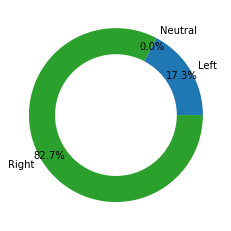

In [107]:
# Visualisiation

label=['Left','Neutral','Right']
plt.pie(side_of_road, labels=label,autopct='%1.1f%%', pctdistance=0.89)
plt.pie([1],colors=['w'],radius=0.7)
plt.show()

82.7 % of accidents happened on Right side of the road

# Weather conditions at the time of accident occurence

In [108]:
weather_conditions = df.groupby(['Weather_Condition']).count()['ID']
weather_conditions

Weather_Condition
Blowing Dust                142
Blowing Dust / Windy        148
Blowing Sand                  1
Blowing Snow                162
Blowing Snow / Windy         86
                           ... 
Volcanic Ash                  4
Widespread Dust              50
Widespread Dust / Windy      18
Wintry Mix                 3843
Wintry Mix / Windy           74
Name: ID, Length: 127, dtype: int64

In [109]:
weather_conditions.sort_values(ascending=False)

Weather_Condition
Fair                         1107194
Mostly Cloudy                 363959
Cloudy                        348767
Partly Cloudy                 249939
Clear                         173823
                              ...   
Low Drifting Snow                  1
Light Fog                          1
Mist / Windy                       1
Sand / Dust Whirls Nearby          1
Sleet / Windy                      1
Name: ID, Length: 127, dtype: int64

In [110]:
#Time of accident occurence sorted and filtered to top 20

weather_conditions.sort_values(ascending=False)[:20]

Weather_Condition
Fair                       1107194
Mostly Cloudy               363959
Cloudy                      348767
Partly Cloudy               249939
Clear                       173823
Light Rain                  128403
Overcast                     84882
Scattered Clouds             45132
Light Snow                   43752
Fog                          41226
Haze                         36354
Rain                         31044
Fair / Windy                 15195
Heavy Rain                   11824
Smoke                         7200
Light Drizzle                 7041
Thunder in the Vicinity       6944
Cloudy / Windy                6839
T-Storm                       6546
Mostly Cloudy / Windy         6297
Name: ID, dtype: int64

In [113]:
Condition = list(df['Weather_Condition'].value_counts()[:20].index)
count = list(df['Weather_Condition'].value_counts()[:20].values)

In [114]:
Condition

['Fair',
 'Mostly Cloudy',
 'Cloudy',
 'Partly Cloudy',
 'Clear',
 'Light Rain',
 'Overcast',
 'Scattered Clouds',
 'Light Snow',
 'Fog',
 'Haze',
 'Rain',
 'Fair / Windy',
 'Heavy Rain',
 'Smoke',
 'Light Drizzle',
 'Thunder in the Vicinity',
 'Cloudy / Windy',
 'T-Storm',
 'Mostly Cloudy / Windy']

<function matplotlib.pyplot.show(close=None, block=None)>

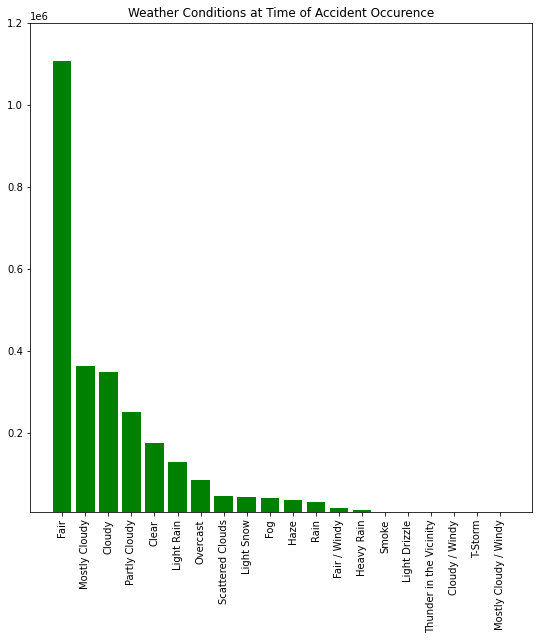

In [118]:
plt.figure(figsize=(9,9))
plt.title("Weather Conditions at Time of Accident Occurence")
plt.bar(Condition,count,color = 'Green')
plt.xticks(rotation=90)
plt.ylim((6000,1200000))
plt.show

Here 1e6 =1 * 10^6

# Latitude and Longitude Visualisation

In [7]:
df.Start_Lat

0          40.108910
1          39.865420
2          39.102660
3          41.062130
4          39.172393
             ...    
2845337    34.002480
2845338    32.766960
2845339    33.775450
2845340    33.992460
2845341    34.133930
Name: Start_Lat, Length: 2845342, dtype: float64

In [12]:
sample_df = df.sample(int(0.1 * len(df)))


<AxesSubplot:xlabel='Start_Lng', ylabel='Start_Lat'>

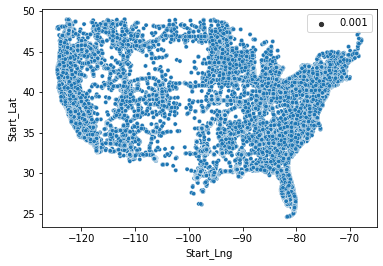

In [14]:
sns.scatterplot(x=sample_df.Start_Lng,y=sample_df.Start_Lat , size = 0.001)

In [16]:
!pip install folium

In [17]:
import folium

In [26]:
from folium.plugins import HeatMap

In [21]:
lat , lon = df.Start_Lat[0] , df.Start_Lng[0]
lat , lon

(40.10891, -83.09286)

In [29]:
sample_df = df.sample(int(0.1 * len(df)))
lat_lon_pairs = list(zip(list(sample_df.Start_Lat),list(sample_df.Start_Lng)))

In [30]:
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map